# Deadly Visualizations!!!

![Image](../images/viz_types_portada.png)

## Setup

First we need to create a basic setup which includes:

- Importing the libraries.

- Reading the dataset file (source [Instituto Nacional de Estadística](https://www.ine.es/ss/Satellite?L=es_ES&c=Page&cid=1259942408928&p=1259942408928&pagename=ProductosYServicios%2FPYSLayout)).

- Create a couple of columns and tables for the analysis.

__NOTE:__ some functions were already created in order to help you go through the challenge. However, feel free to perform any code you might need.

In [1]:
# some imports

import sys
sys.path.insert(0, "../modules")
import pandas as pd
import cufflinks as cf
import plotly.express as px
import re
import module as mod # functions are include in module.py.
cf.go_offline()

In [2]:
# read dataset

deaths = pd.read_csv('../data/7947.csv', sep=';', thousands='.')

deaths.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 301158 entries, 0 to 301157
Data columns (total 5 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   Causa de muerte  301158 non-null  object
 1   Sexo             301158 non-null  object
 2   Edad             301158 non-null  object
 3   Periodo          301158 non-null  int64 
 4   Total            301158 non-null  int64 
dtypes: int64(2), object(3)
memory usage: 11.5+ MB


In [3]:
# add some columns...you'll need them later

deaths['cause_code'] = deaths['Causa de muerte'].apply(mod.cause_code)
deaths['cause_group'] = deaths['Causa de muerte'].apply(mod.cause_types)
deaths['cause_name'] = deaths['Causa de muerte'].apply(mod.cause_name)

deaths.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 301158 entries, 0 to 301157
Data columns (total 8 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   Causa de muerte  301158 non-null  object
 1   Sexo             301158 non-null  object
 2   Edad             301158 non-null  object
 3   Periodo          301158 non-null  int64 
 4   Total            301158 non-null  int64 
 5   cause_code       301158 non-null  object
 6   cause_group      301158 non-null  object
 7   cause_name       301158 non-null  object
dtypes: int64(2), object(6)
memory usage: 18.4+ MB


In [5]:
# lets check the categorical variables

var_list = ['Sexo', 'Edad', 'Periodo', 'cause_code', 'cause_name', 'cause_group']

categories = mod.cat_var(deaths, var_list)
categories

,categorical_variable,number_of_possible_values,values
0,cause_code,117,"[001-102, 001-008, 001, 002, 003, 004, 005, 00..."
1,cause_name,117,"[I-XXII.Todas las causas, I.Enfermedades infec..."
2,Periodo,39,"[2018, 2017, 2016, 2015, 2014, 2013, 2012, 201..."
3,Edad,22,"[Todas las edades, Menos de 1 año, De 1 a 4 añ..."
4,Sexo,3,"[Total, Hombres, Mujeres]"
5,cause_group,2,"[Multiple causes, Single cause]"


In [6]:
# we need also to create a causes table for the analysis

causes_table = deaths[['cause_code', 'cause_name']].drop_duplicates().sort_values(by='cause_code').reset_index(drop=True)

causes_table

,cause_code,cause_name
0,001,Enfermedades infecciosas intestinales
1,001-008,I.Enfermedades infecciosas y parasitarias
2,001-102,I-XXII.Todas las causas
3,002,Tuberculosis y sus efectos tardíos
4,003,Enfermedad meningocócica
...,...,...
112,098,Suicidio y lesiones autoinfligidas
113,099,Agresiones (homicidio)
114,100,Eventos de intención no determinada
115,101,Complicaciones de la atención médica y quirúrgica


In [6]:
# And some space for free-style Pandas!!!








## Lets make some transformations

Eventhough the dataset is pretty clean, the information is completely denormalized as you could see. For that matter a collection of methods (functions) are available in order to generate the tables you might need:

- `row_filter(df, cat_var, cat_values)` => Filter rows by any value or group of values in a categorical variable.

- `nrow_filter(df, cat_var, cat_values)` => The same but backwards. 

- `groupby_sum(df, group_vars, agg_var='Total', sort_var='Total')` => Add deaths by a certain variable.

- `pivot_table(df, col, x_axis, value='Total')`=> Make some pivot tables, you might need them...

## ...and finally, show me some insights with Plotly!!!

Of course, you can always check the [class notes](https://github.com/whiteboxml/teaching-ironhack-dataptmad-2011/tree/main/week_11/interactive_data_visualization) for further info. 

In [59]:
deaths['cause_name'].unique()

array(['I-XXII.Todas las causas',
       'I.Enfermedades infecciosas y parasitarias',
       'Enfermedades infecciosas intestinales',
       'Tuberculosis y sus efectos tardíos', 'Enfermedad meningocócica',
       'Septicemia', 'Hepatitis vírica', 'SIDA',
       'VIH+ (portador, evidencias de laboratorio del VIH, ...)',
       'Resto de enfermedades infecciosas y parasitarias y sus efectos tardíos',
       'II.Tumores',
       'Tumor maligno del labio, de la cavidad bucal y de la faringe',
       'Tumor maligno del esófago', 'Tumor maligno del estómago',
       'Tumor maligno del colon',
       'Tumor maligno del recto, de la porción rectosigmoide y del ano',
       'Tumor maligno del hígado y vías biliares intrahepáticas',
       'Tumor maligno del páncreas', 'Otros tumores malignos digestivos',
       'Tumor maligno de la laringe',
       'Tumor maligno de la tráquea, de los bronquios y del pulmón',
       'Otros tumores malignos respiratorios e intratorácicos',
       'Tumores malig

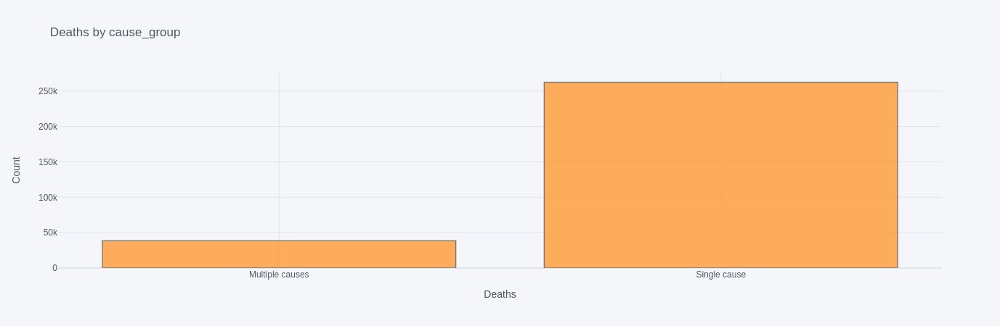

In [7]:
# Cufflinks histogram

deaths['cause_group'].iplot(kind='hist',
                     title='Deaths by cause_group',
                     yTitle='Count',
                     xTitle='Deaths')

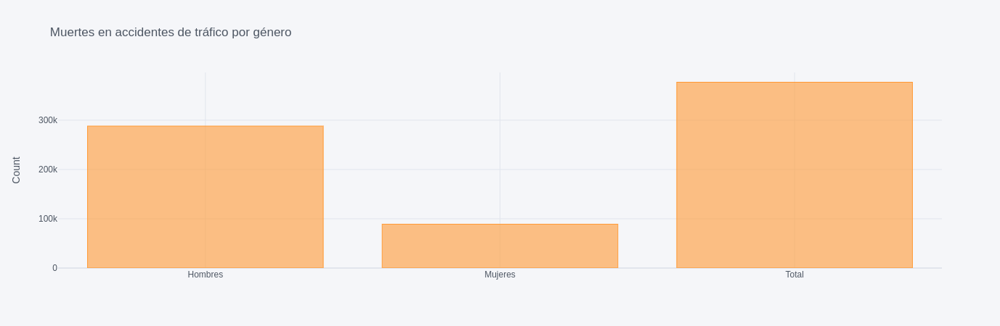

In [72]:
# Cufflinks bar plot

genero_accidente_trafico = deaths[deaths['cause_name'] == 'Accidentes de tráfico'].groupby('Sexo').sum()

genero_accidente_trafico.drop(columns='Periodo').iplot(kind='bar',
                  yTitle='Count',
                  title='Muertes en accidentes de tráfico por género')

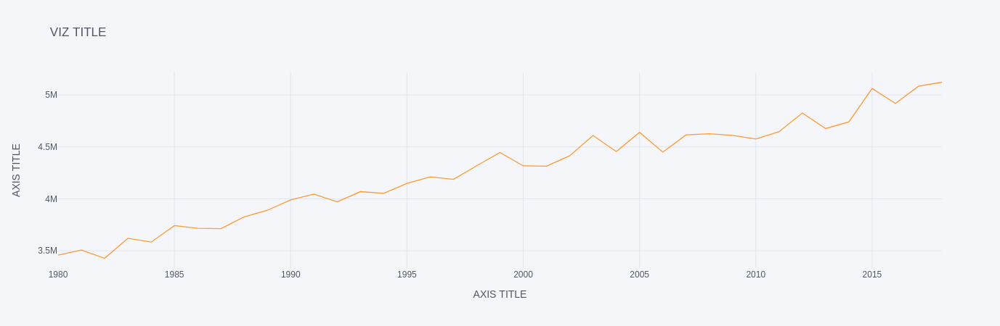

In [10]:
# Cufflinks line plot
deaths_line = deaths.groupby('Periodo')['Total'].sum().to_frame().reset_index()

deaths_line.iplot(kind='line',
                   x='Periodo',
                   xTitle='AXIS TITLE',
                   yTitle='AXIS TITLE',
                   title='VIZ TITLE')

In [108]:
# Cufflinks scatter plot

df_scatter = deaths[(deaths['cause_name'] == 'Otros envenenamientos accidentales') & (deaths['Sexo'] != 'Total')].groupby('Periodo').sum().reset_index()
df_scatter

df_scatter.iplot(kind='scatter', x="Sexo",y="Periodo", categories='Sexo')

KeyError: 'Sexo'